#🐕 End-to-End Multi-Class Dog Classification

This notebook demonstrates the implementation of an end-to-end multi-class image classifier leveraging TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem Statement

The objective is to accurately identify the breed of a dog given an image of the dog. For instance, if someone captures an image of a dog at a café, they should be able to determine its breed using the classifier.

## 2. Dataset

The dataset used in this projec is sourced from kaggle's Dog Breed Identification competition. It comprises labeled images for training and unlabeled images for testing. Detailed dataset information is available at: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation metric for this task involves submitting a file containing prediction probabilities for each dog breed for every test image. The evaluation details can be found here: www.kaggle.com/competitions/dog-breed-identification/overview/evaluation


## 4. Features
#### 1. Nature of Data:
* The dataset consists of images, which are unstructured data, making deep learning and transfer learning suitable approaches for this problem.

#### 2. Number of Classes:
* There are 120 unique dog breeds to classify, translating to 120 distinct output classes.

#### 3. Training and Test Data
* The training dataset includes over 10,000 labeled images.
* The test dataset contains an equivalent number of unlabeled images for which predictions are required.

In [1]:
# Extracting the Kaggle Dog Breed Identification dataset to the specified directory
# !unzip "drive/MyDrive/Dog-Vision Project/zip-file/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-Vision Project/data"

## Get our workspace ready

* Import necessary tools
  * Import TensorFlow 2.X ✅
  * Import TensorFlow Hub ✅
  * Import every necessary tools ✅
* Make sure the GPU is being used ✅

In [2]:
# Import Necessary Libraries
import os
import datetime
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tf_keras as keras
from IPython.display import Image
from sklearn.model_selection import train_test_split

In [3]:
# Define Constants : Set parameters for image preprocessing and training
IMG_SIZE = 224  # Resize images to 224x224 pixels
BATCH_SIZE = 32 # Number of samples per training batch
EPOCHS = 20     # Number of epochs for training
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [90]:
# Define dataset paths (update with your dataset location)
LABELS_PATH = "drive/MyDrive/Dog-Vision-Project/data/labels.csv" # Path to the CSV file containing labels
IMAGES_DIR = "drive/MyDrive/Dog-Vision-Project/images" # Path to the directory containing images
TEST_PATH = "drive/MyDrive/Dog-Vision-Project/data/test" # Path to the test direction

### Load and Prepare Dataset

In [5]:
# Read the labels and prepare data for training
labels_csv = pd.read_csv(LABELS_PATH)

# Provide a description of the dataset
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [6]:
# Show the first 5 rows of the dataset
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
# Put the breed in a variable
unique_breeds = np.unique(labels_csv["breed"])

# Number of dog breeds
OUTPUT_SHAPE = len(unique_breeds)

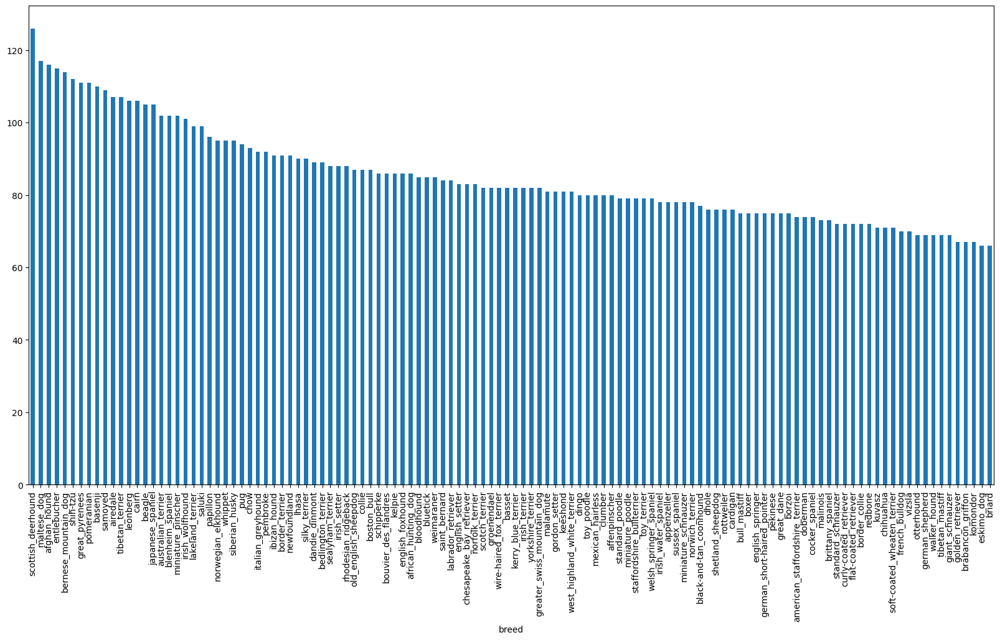

In [8]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

### Getting images and their labels

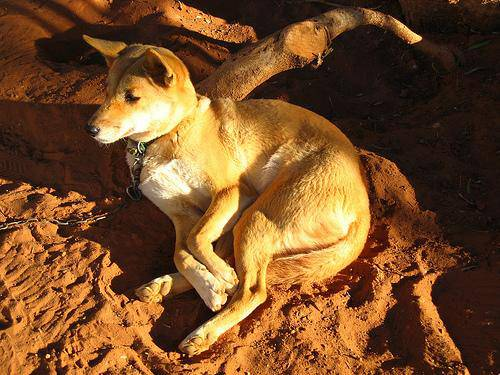

In [9]:
# Let's view an image to see what we are dealing with
Image("drive/MyDrive/Dog-Vision-Project/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [10]:
# Create a pathnames from image ID's
filenames = ["drive/MyDrive/Dog-Vision-Project/data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 5
filenames[:5]

['drive/MyDrive/Dog-Vision-Project/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [11]:
# Check if the number of filenames matches number of actual image files
if len(os.listdir("drive/MyDrive/Dog-Vision-Project/data/train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files.


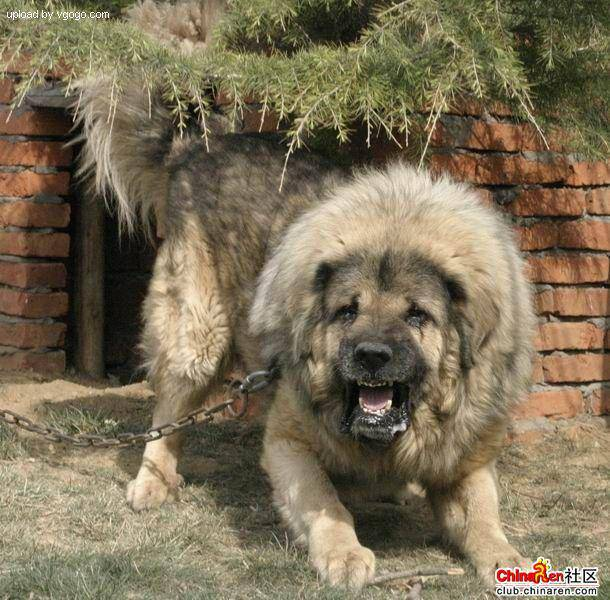

In [12]:
# One more check
Image(filenames[9000])

In [13]:
print(f"The picture immediately above is that of a {labels_csv['breed'][9000]}")

The picture immediately above is that of a tibetan_mastiff


### Labels Preparation

Since we've now got our training image filepaths in a list, let's prepare our labels

In [14]:
# Transform our labels to numeric
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
# Does the number of labels matches that of the filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [16]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.



In [17]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [18]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [19]:
# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
# Check the length of each set
for value in X_train, y_train, X_val, y_val:
  print(len(value), end=" ")

800 800 200 200 

### Preprocessing Images (turning images into Tensors)


To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [20]:
# Function to preprocess and normalize image for the model
def process_image(image_path):
  """
  Load and preprocess an image.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [21]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [22]:
# A trial of the above code
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [23]:
# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [24]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [25]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [26]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

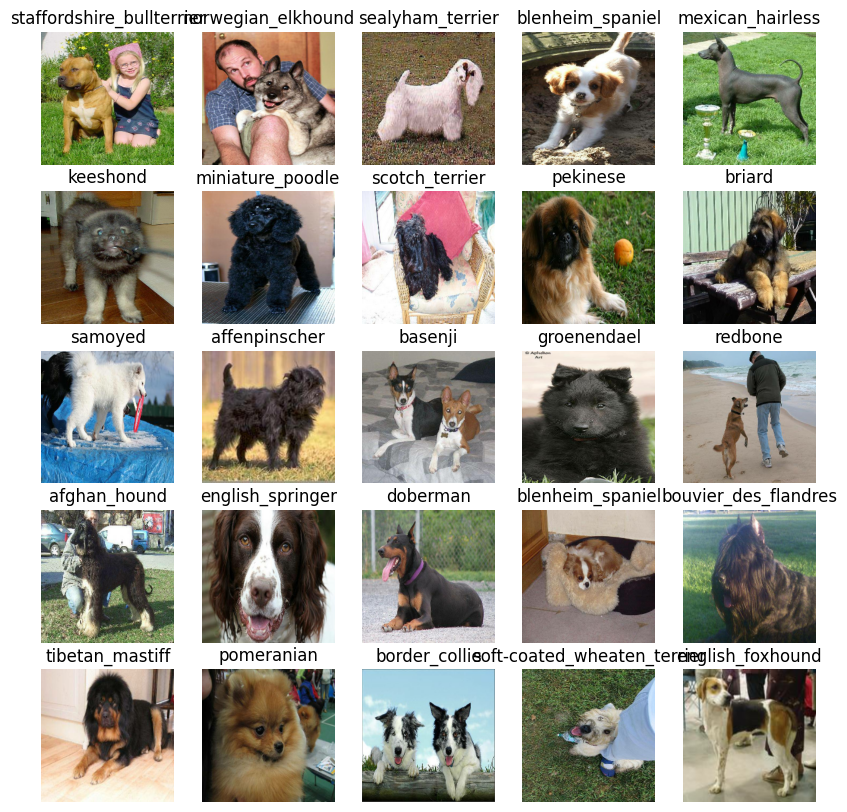

In [27]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

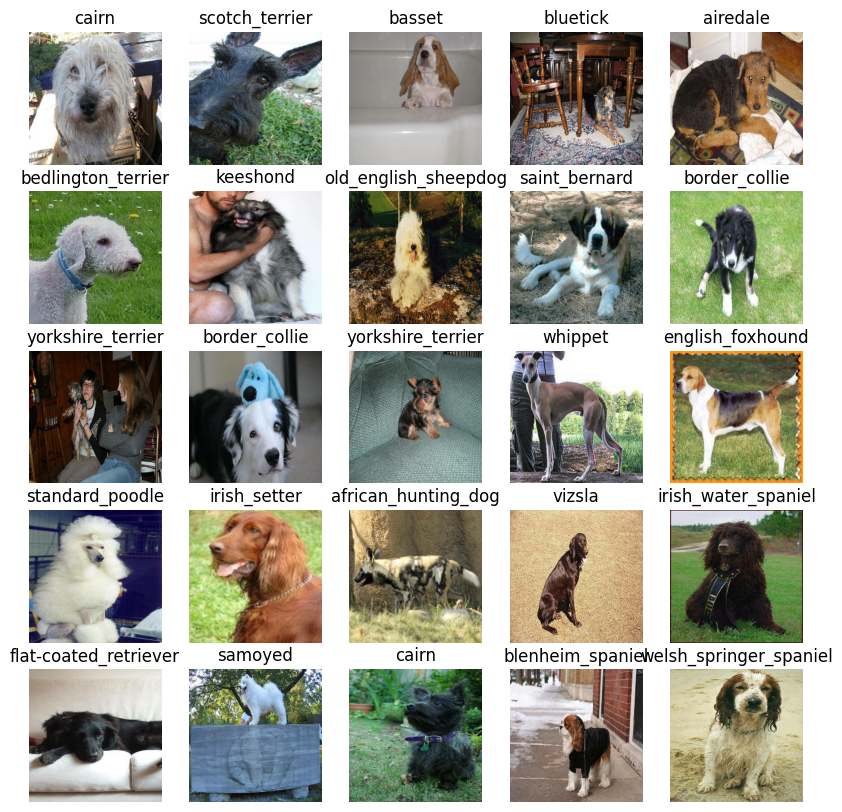

In [28]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a Model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [29]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [30]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [31]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [32]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [62]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join(
      "drive/MyDrive/Dog-Vision-Project/logs",
      # Make it so the logs get tracked whenever we run an experiment
      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir,
                                     histogram_freq=1,
                                     write_graph=True,
                                     write_images=False)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [63]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [64]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [65]:
def train_model():
    """
    Trains a given model and returns the trained version.
    """
    # Create a model
    model = create_model()

    # Create new TensorBoard session every time we train a model
    tensorboard_callback = keras.callbacks.TensorBoard(
        log_dir="drive/MyDrive/Dog-Vision-Project/logs",
        histogram_freq=1,
        write_graph=True,
        write_images=False
    )

    # Early stopping callback
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        patience=3
    )

    # Fit the model to the data, passing the callbacks we created
    model.fit(
            x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1  # No callbacks
            )

    # Return the fitted model
    return model

# Fit the model to the data
model = train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 9s 222ms/step - loss: 4.5953 - accuracy: 0.1000 - val_loss: 3.4663 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 140ms/step - loss: 1.6686 - accuracy: 0.6875 - val_loss: 2.1647 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 5s 206ms/step - loss: 0.5706 - accuracy: 0.9350 - val_loss: 1.6614 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2494 - accuracy: 0.9887 - val_loss: 1.4733 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 5s 189ms/step - loss: 0.1466 - accuracy: 0.9975 - val_loss: 1.4004 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 170ms/step - loss: 0.0987 - accuracy: 1.0000 - val_loss: 1.3524 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [66]:
%tensorboard --logdir drive/MyDrive/Dog-Vision-Project/logs

Output hidden; open in https://colab.research.google.com to view.

### Making and evaluating predictions using a trained model

In [67]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)

7/7 [==============================] - 1s 125ms/step


In [68]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.42094514e-05 9.55585056e-05 1.38463638e-05 3.70520843e-06
 6.72743714e-04 5.71606142e-06 5.29565368e-05 2.62176502e-04
 2.96705775e-03 1.01120565e-02 3.59278033e-06 3.57083167e-07
 9.14571574e-05 9.86926607e-04 3.56249831e-04 4.05381608e-04
 1.06270118e-05 1.26939602e-04 2.98437571e-05 3.03069319e-05
 1.94017730e-06 6.66694395e-05 7.05455705e-06 1.76573633e-06
 3.82758584e-03 5.63589538e-06 3.58276225e-06 6.83614189e-06
 4.58742252e-05 2.77040590e-06 6.62822413e-06 1.50576179e-05
 7.75602530e-06 8.40085193e-07 2.15258979e-06 3.15182342e-06
 1.65565029e-06 3.63496983e-05 3.33402500e-06 3.65830213e-01
 1.33191825e-05 1.40110160e-06 6.58918684e-03 3.33809879e-07
 1.80541145e-04 4.32389925e-06 3.52417846e-05 3.89321322e-05
 2.00386035e-06 7.91406910e-06 6.10821598e-06 3.84175473e-05
 2.34119452e-05 3.47614085e-04 8.56656015e-07 4.66251331e-05
 1.99138685e-05 1.79599522e-06 5.12775478e-06 1.29297791e-06
 3.58262514e-06 5.87891300e-05 2.74974724e-07 5.55650422e-06
 6.57971077e-06 2.598967

In [69]:
unique_breeds[113]

'walker_hound'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [70]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [71]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [72]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

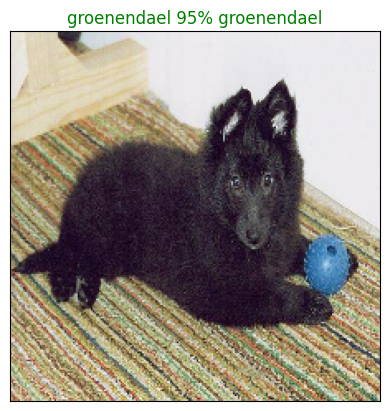

In [73]:
# Try out the above function
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [74]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

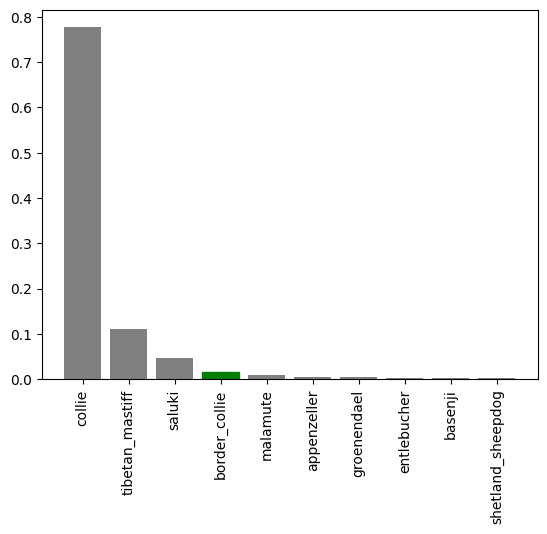

In [75]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

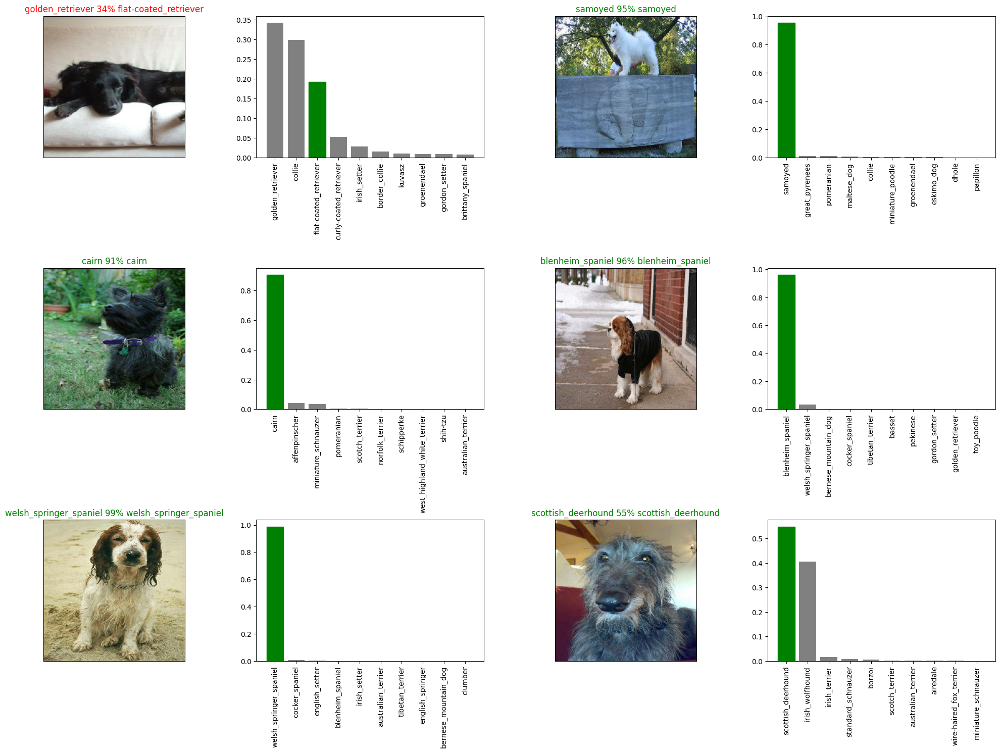

In [76]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [77]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog-Vision-Project/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [78]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!



In [79]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog-Vision-Project/models/20250117-17071737133620-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-Vision-Project/models/20250117-17071737133620-1000-images-mobilenetv2-Adam.h5'

In [80]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog-Vision-Project/models/20250117-16481737132509-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog-Vision-Project/models/20250117-16481737132509-1000-images-mobilenetv2-Adam.h5


In [81]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 152ms/step - loss: 1.1579 - accuracy: 0.7100


[1.1578902006149292, 0.7099999785423279]

In [82]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 167ms/step - loss: 1.1692 - accuracy: 0.6900


[1.1692404747009277, 0.6899999976158142]

### Training a big dog model 🐶 (on the full data)

In [83]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [84]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [85]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [86]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


Note: Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [87]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 53s 152ms/step - loss: 1.3507 - accuracy: 0.6693
Epoch 2/100
320/320 [==============================] - 48s 150ms/step - loss: 0.4063 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 45s 142ms/step - loss: 0.2436 - accuracy: 0.9327
Epoch 4/100
320/320 [==============================] - 45s 139ms/step - loss: 0.1561 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 45s 141ms/step - loss: 0.1070 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 45s 142ms/step - loss: 0.0763 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 47s 145ms/step - loss: 0.0595 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0477 - accuracy: 0.9933
Epoch 9/100
320/320 [==============================] - 45s 139ms/step - loss: 0.0374 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 44s 139m

In [88]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog-Vision-Project/models/20250117-17331737135185-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog-Vision-Project/models/20250117-17331737135185-full-image-set-mobilenetv2-Adam.h5'

In [89]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog-Vision-Project/models/20250117-17331737135185-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog-Vision-Project/models/20250117-17331737135185-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [96]:
# Load test image filenames
test_filenames = [TEST_PATH + "/" + fname for fname in os.listdir(TEST_PATH)]
test_filenames[:5]

['drive/MyDrive/Dog-Vision-Project/data/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/test/dce52d7235885d9ad2ae34006e2ecb1e.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/test/dd2228d2fbb3ddc8fb350106c2d989ef.jpg',
 'drive/MyDrive/Dog-Vision-Project/data/test/dd539ec1933bc47bc80b1447a26aef45.jpg']

In [97]:
len(test_filenames)

10357

In [98]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


**Note:** Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [99]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 296s 892ms/step


In [101]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog-Vision-Project/prediction/preds_array.csv", test_predictions, delimiter=",")

In [102]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog-Vision-Project/prediction/preds_array.csv", delimiter=",")

In [103]:
test_predictions[:10]

array([[4.99183420e-12, 2.07399116e-05, 1.20182519e-09, ...,
        1.13353954e-05, 2.53776250e-07, 1.38877651e-11],
       [2.69327138e-08, 3.46555680e-05, 3.90801542e-05, ...,
        4.41501697e-08, 1.45747021e-13, 4.51696906e-07],
       [9.62461777e-10, 7.35720318e-10, 1.05955793e-10, ...,
        1.36985046e-09, 2.41869921e-03, 4.65463017e-07],
       ...,
       [5.42716878e-11, 2.55089412e-06, 1.04721362e-11, ...,
        3.31564026e-10, 3.05712816e-10, 1.10328476e-10],
       [2.81548225e-08, 2.47333242e-06, 1.81565304e-06, ...,
        7.29169142e-06, 9.86701343e-06, 3.95776922e-09],
       [1.94275845e-11, 3.12721127e-10, 2.32843068e-11, ...,
        9.57340096e-10, 9.25185067e-11, 3.75882441e-12]])

In [104]:
test_predictions.shape

(10357, 120)

### Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
Compare the predicted labels to the custom images.

In [109]:
# Get custom image filepaths
custom_image_paths = [IMAGES_DIR +  "/" + fname for fname in os.listdir(IMAGES_DIR)]

In [110]:
custom_image_paths

['drive/MyDrive/Dog-Vision-Project/images/gog.jpg']

In [111]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [112]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 905ms/step


In [113]:
custom_preds.shape

(1, 120)

In [114]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['tibetan_mastiff']

In [115]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

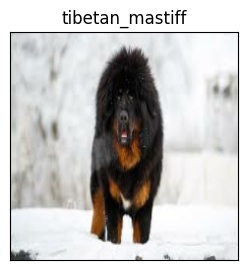

In [116]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)